# GeoPandas - gráficos y mapas

**Bibliotecas**

In [1]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, Polygon

import matplotlib.pyplot as plt
%matplotlib inline

import calendar

import folium
from folium import plugins
from folium.plugins import HeatMapWithTime

**Variables globales**

In [2]:
# Archivo de datos con columnas del DwC (https://dwc.tdwg.org/terms/)
archivo_datos = "datos/ara-macao-cr-2018.csv"

# Nombre científico que se desplegará en los gráficos estadísticos
nombre_cientifico = "Ara macao"

# Cantidad máxima de registros que se despliegan en un GeoDataFrame
pd.options.display.max_rows = 12

## Carga y limpieza de datos

In [3]:
# Carga de datos en un DataFrame
registros_presencia_df = pd.read_csv(archivo_datos, sep='\t')
registros_presencia_df

# registros_presencia_df.head()
# registros_presencia_df.tail()

,gbifID,datasetKey,occurrenceID,kingdom,phylum,class,order,family,genus,species,...,identifiedBy,dateIdentified,license,rightsHolder,recordedBy,typeStatus,establishmentMeans,lastInterpreted,mediaType,issue
0,2283249171,50c9509d-22c7-4a22-a47d-8c48425ef4a7,https://www.inaturalist.org/observations/28522005,Animalia,Chordata,Aves,Psittaciformes,Psittacidae,Ara,Ara macao,...,NaN,2019-07-09T21:52:47Z,CC_BY_NC_4_0,Ari Rice,Ari Rice,NaN,NaN,2019-08-28T00:35:26.986Z,STILLIMAGE,GEODETIC_DATUM_ASSUMED_WGS84;COORDINATE_ROUNDED
1,2244271414,50c9509d-22c7-4a22-a47d-8c48425ef4a7,https://www.inaturalist.org/observations/25412608,Animalia,Chordata,Aves,Psittaciformes,Psittacidae,Ara,Ara macao,...,NaN,2019-05-19T23:11:00Z,CC_BY_NC_4_0,bandonman,bandonman,NaN,NaN,2019-08-28T00:21:20.370Z,STILLIMAGE,GEODETIC_DATUM_ASSUMED_WGS84;COORDINATE_ROUNDED
2,2242831216,50c9509d-22c7-4a22-a47d-8c48425ef4a7,https://www.inaturalist.org/observations/24530685,Animalia,Chordata,Aves,Psittaciformes,Psittacidae,Ara,Ara macao,...,NaN,2019-05-04T19:13:19Z,CC_BY_NC_4_0,Gustavo Garza Arrambide,Gustavo Garza Arrambide,NaN,NaN,2019-08-28T00:16:58.828Z,STILLIMAGE,GEODETIC_DATUM_ASSUMED_WGS84;COORDINATE_ROUNDED
3,2242813134,50c9509d-22c7-4a22-a47d-8c48425ef4a7,https://www.inaturalist.org/observations/24455509,Animalia,Chordata,Aves,Psittaciformes,Psittacidae,Ara,Ara macao,...,NaN,2019-05-03T18:15:42Z,CC_BY_NC_4_0,chris-hannah,chris-hannah,NaN,NaN,2019-08-28T00:16:36.439Z,STILLIMAGE,GEODETIC_DATUM_ASSUMED_WGS84;COORDINATE_ROUNDED
4,2233925578,4fa7b334-ce0d-4e88-aaae-2e0c138d049e,URN:catalog:CLO:EBIRD:OBS706459325,Animalia,Chordata,Aves,Psittaciformes,Psittacidae,Ara,Ara macao,...,NaN,NaN,CC0_1_0,NaN,obsr1089638,NaN,NaN,2019-03-31T21:19:08.104Z,NaN,COORDINATE_ROUNDED
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5309,1807286620,50c9509d-22c7-4a22-a47d-8c48425ef4a7,https://www.inaturalist.org/observations/9669545,Animalia,Chordata,Aves,Psittaciformes,Psittacidae,Ara,Ara macao,...,NaN,2018-01-30T17:54:57Z,CC_BY_NC_4_0,mkkennedy,mkkennedy,NaN,NaN,2019-08-28T02:46:28.417Z,STILLIMAGE,GEODETIC_DATUM_ASSUMED_WGS84;COORDINATE_ROUNDED
5310,1806376988,50c9509d-22c7-4a22-a47d-8c48425ef4a7,https://www.inaturalist.org/observations/9663536,Animalia,Chordata,Aves,Psittaciformes,Psittacidae,Ara,Ara macao,...,NaN,2018-01-30T02:29:40Z,CC_BY_NC_4_0,Ross Millikan,Ross Millikan,NaN,NaN,2019-08-28T02:46:26.003Z,STILLIMAGE,GEODETIC_DATUM_ASSUMED_WGS84;COORDINATE_ROUNDED
5311,1806350808,50c9509d-22c7-4a22-a47d-8c48425ef4a7,https://www.inaturalist.org/observations/9578030,Animalia,Chordata,Aves,Psittaciformes,Psittacidae,Ara,Ara macao,...,NaN,2018-01-23T19:54:12Z,CC_BY_NC_4_0,Steve Mech,Steve Mech,NaN,NaN,2019-08-28T02:45:51.885Z,STILLIMAGE,GEODETIC_DATUM_ASSUMED_WGS84;COORDINATE_ROUNDED
5312,1802787827,50c9509d-22c7-4a22-a47d-8c48425ef4a7,https://www.inaturalist.org/observations/9398884,Animalia,Chordata,Aves,Psittaciformes,Psittacidae,Ara,Ara macao,...,NaN,NaN,CC_BY_NC_4_0,Maria Auxiliadora Mora Cross,Maria Auxiliadora Mora Cross,NaN,NaN,2019-08-28T02:44:27.771Z,STILLIMAGE,GEODETIC_DATUM_ASSUMED_WGS84;COORDINATE_ROUNDED


In [4]:
# Lista de columnas
list(registros_presencia_df.columns)

['gbifID',
 'datasetKey',
 'occurrenceID',
 'kingdom',
 'phylum',
 'class',
 'order',
 'family',
 'genus',
 'species',
 'infraspecificEpithet',
 'taxonRank',
 'scientificName',
 'verbatimScientificName',
 'verbatimScientificNameAuthorship',
 'countryCode',
 'locality',
 'stateProvince',
 'occurrenceStatus',
 'individualCount',
 'publishingOrgKey',
 'decimalLatitude',
 'decimalLongitude',
 'coordinateUncertaintyInMeters',
 'coordinatePrecision',
 'elevation',
 'elevationAccuracy',
 'depth',
 'depthAccuracy',
 'eventDate',
 'day',
 'month',
 'year',
 'taxonKey',
 'speciesKey',
 'basisOfRecord',
 'institutionCode',
 'collectionCode',
 'catalogNumber',
 'recordNumber',
 'identifiedBy',
 'dateIdentified',
 'license',
 'rightsHolder',
 'recordedBy',
 'typeStatus',
 'establishmentMeans',
 'lastInterpreted',
 'mediaType',
 'issue']

In [5]:
# Tipos de datos de las columnas
registros_presencia_df.dtypes

gbifID                  int64
datasetKey             object
occurrenceID           object
kingdom                object
phylum                 object
                       ...   
typeStatus            float64
establishmentMeans    float64
lastInterpreted        object
mediaType              object
issue                  object
Length: 50, dtype: object

In [6]:
# Información sobre el DataFrame
registros_presencia_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5314 entries, 0 to 5313
Data columns (total 50 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   gbifID                            5314 non-null   int64  
 1   datasetKey                        5314 non-null   object 
 2   occurrenceID                      5312 non-null   object 
 3   kingdom                           5314 non-null   object 
 4   phylum                            5314 non-null   object 
 5   class                             5314 non-null   object 
 6   order                             5314 non-null   object 
 7   family                            5314 non-null   object 
 8   genus                             5314 non-null   object 
 9   species                           5314 non-null   object 
 10  infraspecificEpithet              0 non-null      float64
 11  taxonRank                         5314 non-null   object 
 12  scient

In [7]:
# Selección de un subconjunto de columnas
registros_presencia_df = registros_presencia_df[['species', 'stateProvince', 'locality', 'decimalLongitude', 'decimalLatitude', 'eventDate']]
registros_presencia_df

,species,stateProvince,locality,decimalLongitude,decimalLatitude,eventDate
0,Ara macao,Puntarenas,NaN,-83.744504,8.651553,2018-01-05T15:56:00Z
1,Ara macao,Puntarenas,NaN,-84.700355,9.691419,2018-11-25T17:53:00Z
2,Ara macao,Puntarenas,NaN,-83.622591,8.719476,2018-07-02T14:08:00Z
3,Ara macao,Puntarenas,NaN,-84.575723,9.690136,2018-01-29T16:36:00Z
4,Ara macao,Guanacaste,Nammbú - Playa Carrillo,-85.480936,9.864875,2018-10-25T00:00:00Z
...,...,...,...,...,...,...
5309,Ara macao,Puntarenas,NaN,-84.663720,9.957114,2018-01-24T00:00:00Z
5310,Ara macao,Puntarenas,NaN,-83.929924,9.330319,2018-01-29T14:17:00Z
5311,Ara macao,Puntarenas,NaN,-83.758478,8.699296,2018-01-13T17:38:00Z
5312,Ara macao,Puntarenas,NaN,-84.736245,9.603840,2018-01-03T14:39:00Z


In [9]:
# Consulta del tipo de datos de una columna
registros_presencia_df.eventDate.dtypes

dtype('O')

In [10]:
# Cambio del tipo de datos dateTime
registros_presencia_df["eventDate"] = pd.to_datetime(registros_presencia_df["eventDate"])

<ipython-input-10-b078052fb2bc>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  registros_presencia_df["eventDate"] = pd.to_datetime(registros_presencia_df["eventDate"])


In [11]:
# Verificación del nuevo tipo de datos de la columna
registros_presencia_df.eventDate.dtypes

datetime64[ns, UTC]

In [12]:
# Revisión del DataFrame para verificar la columna cambiada
registros_presencia_df

,species,stateProvince,locality,decimalLongitude,decimalLatitude,eventDate
0,Ara macao,Puntarenas,NaN,-83.744504,8.651553,2018-01-05 15:56:00+00:00
1,Ara macao,Puntarenas,NaN,-84.700355,9.691419,2018-11-25 17:53:00+00:00
2,Ara macao,Puntarenas,NaN,-83.622591,8.719476,2018-07-02 14:08:00+00:00
3,Ara macao,Puntarenas,NaN,-84.575723,9.690136,2018-01-29 16:36:00+00:00
4,Ara macao,Guanacaste,Nammbú - Playa Carrillo,-85.480936,9.864875,2018-10-25 00:00:00+00:00
...,...,...,...,...,...,...
5309,Ara macao,Puntarenas,NaN,-84.663720,9.957114,2018-01-24 00:00:00+00:00
5310,Ara macao,Puntarenas,NaN,-83.929924,9.330319,2018-01-29 14:17:00+00:00
5311,Ara macao,Puntarenas,NaN,-83.758478,8.699296,2018-01-13 17:38:00+00:00
5312,Ara macao,Puntarenas,NaN,-84.736245,9.603840,2018-01-03 14:39:00+00:00


## Análisis de la información

### Graficación

In [13]:
# Estilo de los gráficos
plt.style.use('ggplot')

#### Distribución de registros por mes

In [14]:
# Agrupación de los registros por mes
registros_x_mes = registros_presencia_df.groupby(registros_presencia_df['eventDate'].dt.month).count().eventDate

registros_x_mes

eventDate
1     757
2     772
3     805
4     401
5     455
6     277
7     331
8     286
9     122
10    186
11    322
12    600
Name: eventDate, dtype: int64

In [15]:
# Reemplazo del número del mes por el nombre del mes
registros_x_mes.index=[calendar.month_name[x] for x in range(1,13)]

registros_x_mes

January      757
February     772
March        805
April        401
May          455
June         277
July         331
August       286
September    122
October      186
November     322
December     600
Name: eventDate, dtype: int64

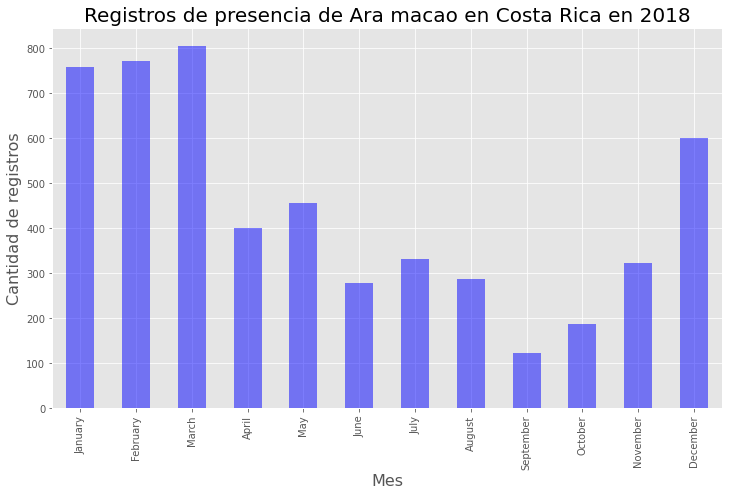

In [16]:
# Gráfico de barras
registros_x_mes.plot(kind='bar',figsize=(12,7), color='blue', alpha=0.5)

# Título y leyendas en los ejes
plt.title('Registros de presencia de ' + nombre_cientifico + ' en Costa Rica en 2018', fontsize=20)
plt.xlabel('Mes', fontsize=16)
plt.ylabel('Cantidad de registros', fontsize=16);

#### Distribución de registros por día de la semana

In [17]:
# Agrupación de los registros por día de la semana
registros_x_dia_semana = registros_presencia_df.groupby(registros_presencia_df['eventDate'].dt.dayofweek).count().eventDate

registros_x_dia_semana

eventDate
0    777
1    676
2    721
3    655
4    721
5    991
6    773
Name: eventDate, dtype: int64

In [18]:
# Reemplazo del número del día por el nombre del día
registros_x_dia_semana.index=[calendar.day_name[x] for x in range(0, 7)]

registros_x_dia_semana

Monday       777
Tuesday      676
Wednesday    721
Thursday     655
Friday       721
Saturday     991
Sunday       773
Name: eventDate, dtype: int64

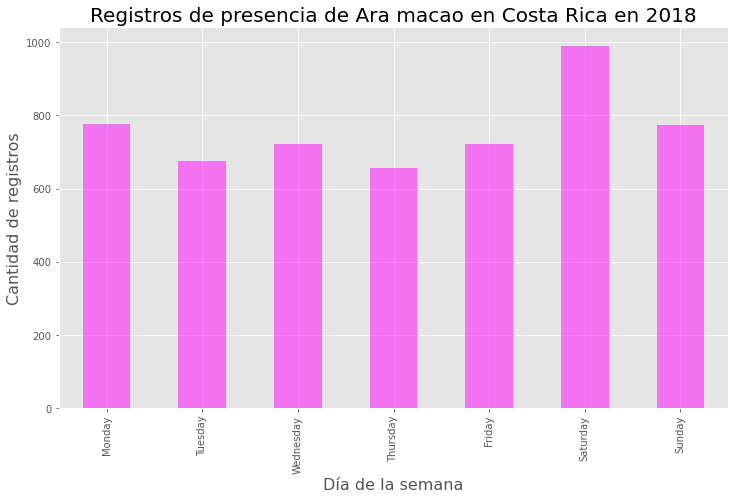

In [19]:
# Gráfico de barras
registros_x_dia_semana.plot(kind='bar', figsize=(12,7), color='magenta', alpha=0.5)

# Título y leyendas en los ejes
plt.title('Registros de presencia de ' + nombre_cientifico + ' en Costa Rica en 2018', fontsize=20)
plt.xlabel('Día de la semana', fontsize=16)
plt.ylabel('Cantidad de registros', fontsize=16);

#### Distribución de registros por fecha

In [20]:
# Agrupación de los registros por día del año
registros_x_fecha = registros_presencia_df.groupby(registros_presencia_df['eventDate'].dt.date).count().eventDate

registros_x_fecha

eventDate
2018-01-01    10
2018-01-02    18
2018-01-03    27
2018-01-04    33
2018-01-05    27
              ..
2018-12-27    19
2018-12-28    14
2018-12-29    15
2018-12-30    41
2018-12-31    11
Name: eventDate, Length: 361, dtype: int64

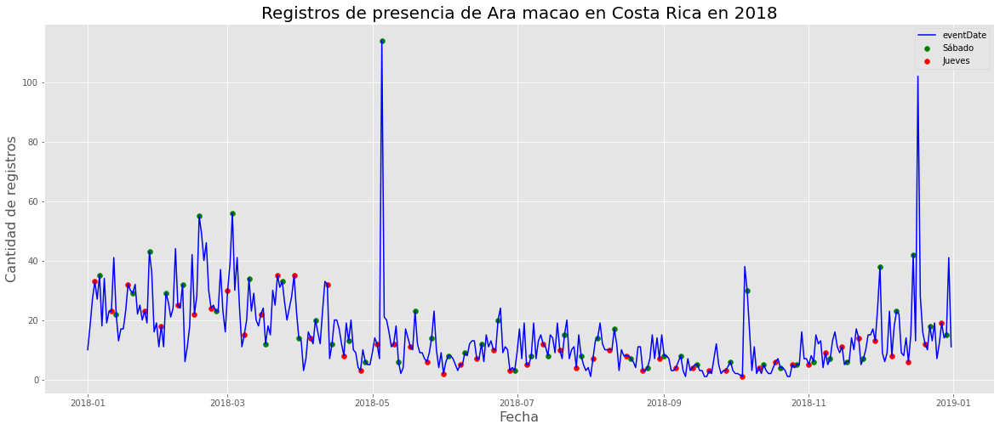

In [21]:
# Gráfico de líneas
registros_x_fecha.plot(figsize=(20,8), color='blue')

# Marca para el día de la semana con más registros
registros_sabados = registros_presencia_df.groupby(registros_presencia_df[registros_presencia_df['eventDate'].dt.dayofweek==5].eventDate.dt.date).count().eventDate
plt.scatter(registros_sabados.index, registros_sabados, color='green', label='Sábado')

# Marca para el día de la semana con menos registros
registros_jueves = registros_presencia_df.groupby(registros_presencia_df[registros_presencia_df['eventDate'].dt.dayofweek==3].eventDate.dt.date).count().eventDate
plt.scatter(registros_jueves.index, registros_jueves, color='red', label='Jueves')

# Título y leyendas en los ejes
plt.title('Registros de presencia de ' + nombre_cientifico + ' en Costa Rica en 2018', fontsize=20)
plt.xlabel('Fecha',fontsize=16)
plt.ylabel('Cantidad de registros',fontsize=16);
plt.legend()

#### Distribución de registros por provincia

In [22]:
# Agrupación de los registros por provincia
registros_x_provincia = registros_presencia_df.groupby(registros_presencia_df['stateProvince'])['stateProvince'].count()

registros_x_provincia

stateProvince
Alajuela       153
Guanacaste     127
Heredia        298
Limón           22
Puntarenas    4504
San José       208
Name: stateProvince, dtype: int64

In [ ]:
# Gráfico de barras
registros_x_provincia.plot(kind='bar',figsize=(12,7), color='brown', alpha=0.5)

# Leyendas en los ejes
plt.title('Registros de presencia de ' + nombre_cientifico + ' en Costa Rica en 2018', fontsize=20)
plt.xlabel('Provincia', fontsize=16)
plt.ylabel('Cantidad de registros', fontsize=16);

Text(0, 0.5, '')

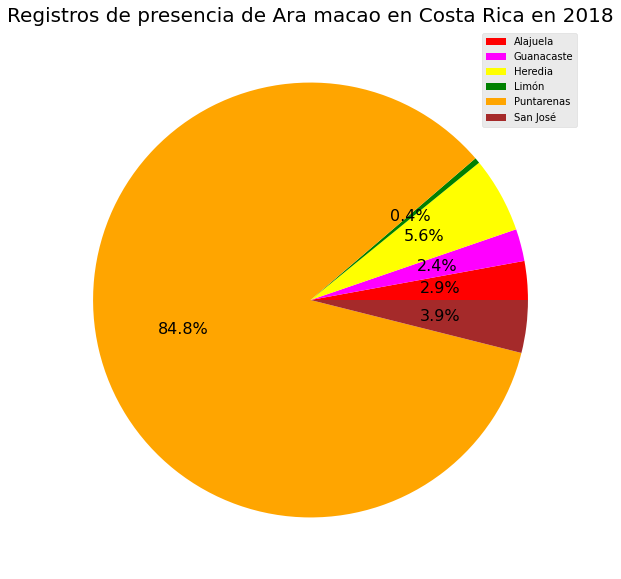

In [23]:
# Gráfico de pastel
registros_x_provincia.plot(kind='pie',figsize=(10,10), colors=['red', 'magenta', 'yellow', 'green', 'orange', 'brown'], labels=None, autopct='%1.1f%%', fontsize=16)

# Leyendas y título
plt.legend(labels=['Alajuela', 'Guanacaste', 'Heredia', 'Limón', 'Puntarenas', 'San José'])
plt.title('Registros de presencia de ' + nombre_cientifico + ' en Costa Rica en 2018', fontsize=20)
plt.ylabel('')

### Mapeo

#### GeoPandas

In [24]:
# Geodataframe
registros_presencia_geom = [Point(xy) for xy in zip(registros_presencia_df["decimalLongitude"], registros_presencia_df["decimalLatitude"])]
registros_presencia_gdf=gpd.GeoDataFrame(registros_presencia_df, crs={"init": "epsg:4326"}, geometry=registros_presencia_geom)

C:\Users\gabriel.corrales\Anaconda3\envs\leccion-12a\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [26]:
registros_presencia_df

,species,stateProvince,locality,decimalLongitude,decimalLatitude,eventDate,geometry
0,Ara macao,Puntarenas,NaN,-83.744504,8.651553,2018-01-05 15:56:00+00:00,POINT (-83.74450 8.65155)
1,Ara macao,Puntarenas,NaN,-84.700355,9.691419,2018-11-25 17:53:00+00:00,POINT (-84.70036 9.69142)
2,Ara macao,Puntarenas,NaN,-83.622591,8.719476,2018-07-02 14:08:00+00:00,POINT (-83.62259 8.71948)
3,Ara macao,Puntarenas,NaN,-84.575723,9.690136,2018-01-29 16:36:00+00:00,POINT (-84.57572 9.69014)
4,Ara macao,Guanacaste,Nammbú - Playa Carrillo,-85.480936,9.864875,2018-10-25 00:00:00+00:00,POINT (-85.48094 9.86487)
...,...,...,...,...,...,...,...
5309,Ara macao,Puntarenas,NaN,-84.663720,9.957114,2018-01-24 00:00:00+00:00,POINT (-84.66372 9.95711)
5310,Ara macao,Puntarenas,NaN,-83.929924,9.330319,2018-01-29 14:17:00+00:00,POINT (-83.92992 9.33032)
5311,Ara macao,Puntarenas,NaN,-83.758478,8.699296,2018-01-13 17:38:00+00:00,POINT (-83.75848 8.69930)
5312,Ara macao,Puntarenas,NaN,-84.736245,9.603840,2018-01-03 14:39:00+00:00,POINT (-84.73624 9.60384)


#### Folium

In [25]:
# Mapa centrado en Costa Rica
registros_presencia_mapa = folium.Map(location=[9.63, -84], zoom_start=8)

registros_presencia_mapa

##### Mapa de puntos

In [28]:
# Mapa centrado en Costa Rica
registros_presencia_mapa = folium.Map(location=[9.63, -84], zoom_start=8)

# Mapeo de los puntos correspondientes a los registros de presencia
for lat, lng, label in zip(registros_presencia_df.decimalLatitude, registros_presencia_df.decimalLongitude, registros_presencia_df.eventDate.astype(str)):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        color='red',
        fill=True,
        popup=label,
        fill_color='darkred',
        fill_opacity=0.6
    ).add_to(registros_presencia_mapa)
    
registros_presencia_mapa

##### Mapa de "cluster"

In [29]:
# Mapa centrado en Costa Rica
registros_presencia_mapa = folium.Map(location=[9.63, -84], zoom_start=8)

# Instantiate a mark cluster object for the car accidents
registros_presencia_cluster = plugins.MarkerCluster().add_to(registros_presencia_mapa)

for lat, lng, label in zip(registros_presencia_df.decimalLatitude, registros_presencia_df.decimalLongitude, registros_presencia_df.eventDate.astype(str)):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(registros_presencia_cluster)    
    
registros_presencia_mapa

##### Mapa de calor

In [30]:
# Mapa centrado en Costa Rica
registros_presencia_mapa = folium.Map(location=[9.63, -84], zoom_start=8)

lista_meses = [[] for _ in range(13)]
for lat, log, mes in zip(registros_presencia_df.decimalLatitude, registros_presencia_df.decimalLongitude, registros_presencia_df.eventDate.dt.month):
    lista_meses[mes].append([lat,log]) 
    
# Etiqueas que indican la cantidad de meses
index = [str(i)+' Meses' for i in range(13)]

# Mapa de calor
HeatMapWithTime(lista_meses, index).add_to(registros_presencia_mapa)

registros_presencia_mapa    